In [ ]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
# import geopandas as gpd
# import geoplot as gplt
# import mapclassify as mc
import numpy as np

# Importing dataset from google drive

In [ ]:
from google.colab import drive
drive.mount("/content/drive")

Mounted at /content/drive


In [ ]:
%cd drive/MyDrive/US_Vaccine_data/

/content/drive/MyDrive/US_Vaccine_data


In [ ]:
%ls

catboost_info/
county_population.csv
COVID-19_Vaccinations_in_the_United_States_County.csv
COVID-19_Vaccinations_in_the_United_States_County_temp.csv
daily_cases_deaths.csv
educationData/
logs.log
Population/
populationData_ignore/
state_policies/
Unemployment/


In [ ]:
covid_vaccine_df = pd.read_csv('COVID-19_Vaccinations_in_the_United_States_County_temp.csv',parse_dates = ['Date'], low_memory = False)
print('Shape of covid_vaccine_df ', covid_vaccine_df.shape)
print(covid_vaccine_df.head)
print(covid_vaccine_df['Recip_County'].value_counts())

Shape of covid_vaccine_df  (1023988, 32)
<bound method NDFrame.head of               Date  ... Series_Complete_65PlusPop_Pct_UR_Equity
0       2021-10-20  ...                                     8.0
1       2021-10-20  ...                                     7.0
2       2021-10-20  ...                                     8.0
3       2021-10-20  ...                                     8.0
4       2021-10-20  ...                                     8.0
...            ...  ...                                     ...
1023983 2020-12-13  ...                                     NaN
1023984 2020-12-13  ...                                     NaN
1023985 2020-12-13  ...                                     NaN
1023986 2020-12-13  ...                                     NaN
1023987 2020-12-13  ...                                     NaN

[1023988 rows x 32 columns]>
Unknown County       17887
Washington County     9361
Jefferson County      7803
Franklin County       7489
Lincoln County        7

In [ ]:
Primaryfeatures = covid_vaccine_df.columns

# Preprocessing

In [ ]:
nanPercent = covid_vaccine_df.isna().sum() / covid_vaccine_df.shape[0] * 100
nanPercent

Date                                        0.000000
FIPS                                        0.000000
MMWR_week                                   0.000000
Recip_County                                0.000000
Recip_State                                 0.000000
Series_Complete_Pop_Pct                     0.000000
Series_Complete_Yes                         0.000000
Series_Complete_12Plus                      1.371207
Series_Complete_12PlusPop_Pct               1.371207
Series_Complete_18Plus                      0.000000
Series_Complete_18PlusPop_Pct               0.000000
Series_Complete_65Plus                      0.000000
Series_Complete_65PlusPop_Pct               0.000000
Completeness_pct                            0.000000
Administered_Dose1_Recip                    3.206776
Administered_Dose1_Pop_Pct                  0.000000
Administered_Dose1_Recip_12Plus             6.968539
Administered_Dose1_Recip_12PlusPop_Pct      1.371207
Administered_Dose1_Recip_18Plus             5.

Observation: 'Series_Complete_Pop_Pct_UR_Equity',
'Series_Complete_12PlusPop_Pct_UR_Equity',
'Series_Complete_18PlusPop_Pct_UR_Equity',
'Series_Complete_65PlusPop_Pct_UR_Equity',
'Series_Complete_Pop_Pct_SVI',
'Series_Complete_12PlusPop_Pct_SVI',
'Series_Complete_18PlusPop_Pct_SVI',
'Series_Complete_65PlusPop_Pct_SVI', columns have 20% of nan's. Replacing data with median.

We have unkown counties, Dropping unknown data.

In [ ]:
covid_vaccine_df = covid_vaccine_df[covid_vaccine_df["Recip_County"] != 'Unknown County']

In [ ]:
covid_vaccine_df.shape

(1006101, 32)

In [ ]:
Primaryfeatures

Index(['Date', 'FIPS', 'MMWR_week', 'Recip_County', 'Recip_State',
       'Series_Complete_Pop_Pct', 'Series_Complete_Yes',
       'Series_Complete_12Plus', 'Series_Complete_12PlusPop_Pct',
       'Series_Complete_18Plus', 'Series_Complete_18PlusPop_Pct',
       'Series_Complete_65Plus', 'Series_Complete_65PlusPop_Pct',
       'Completeness_pct', 'Administered_Dose1_Recip',
       'Administered_Dose1_Pop_Pct', 'Administered_Dose1_Recip_12Plus',
       'Administered_Dose1_Recip_12PlusPop_Pct',
       'Administered_Dose1_Recip_18Plus',
       'Administered_Dose1_Recip_18PlusPop_Pct',
       'Administered_Dose1_Recip_65Plus',
       'Administered_Dose1_Recip_65PlusPop_Pct', 'SVI_CTGY',
       'Series_Complete_Pop_Pct_SVI', 'Series_Complete_12PlusPop_Pct_SVI',
       'Series_Complete_18PlusPop_Pct_SVI',
       'Series_Complete_65PlusPop_Pct_SVI', 'Metro_status',
       'Series_Complete_Pop_Pct_UR_Equity',
       'Series_Complete_12PlusPop_Pct_UR_Equity',
       'Series_Complete_18PlusPop_P

In [ ]:
use_cols = []
for feat in Primaryfeatures:
  if int(nanPercent[feat]) != 0.0:
    use_cols.append(feat)

use_cols

['Series_Complete_12Plus',
 'Series_Complete_12PlusPop_Pct',
 'Administered_Dose1_Recip',
 'Administered_Dose1_Recip_12Plus',
 'Administered_Dose1_Recip_12PlusPop_Pct',
 'Administered_Dose1_Recip_18Plus',
 'Administered_Dose1_Recip_65Plus',
 'SVI_CTGY',
 'Series_Complete_Pop_Pct_SVI',
 'Series_Complete_12PlusPop_Pct_SVI',
 'Series_Complete_18PlusPop_Pct_SVI',
 'Series_Complete_65PlusPop_Pct_SVI',
 'Metro_status',
 'Series_Complete_Pop_Pct_UR_Equity',
 'Series_Complete_12PlusPop_Pct_UR_Equity',
 'Series_Complete_18PlusPop_Pct_UR_Equity',
 'Series_Complete_65PlusPop_Pct_UR_Equity']

In [ ]:
use_cols

['Series_Complete_12Plus',
 'Series_Complete_12PlusPop_Pct',
 'Administered_Dose1_Recip',
 'Administered_Dose1_Recip_12Plus',
 'Administered_Dose1_Recip_12PlusPop_Pct',
 'Administered_Dose1_Recip_18Plus',
 'Administered_Dose1_Recip_65Plus',
 'SVI_CTGY',
 'Series_Complete_Pop_Pct_SVI',
 'Series_Complete_12PlusPop_Pct_SVI',
 'Series_Complete_18PlusPop_Pct_SVI',
 'Series_Complete_65PlusPop_Pct_SVI',
 'Metro_status',
 'Series_Complete_Pop_Pct_UR_Equity',
 'Series_Complete_12PlusPop_Pct_UR_Equity',
 'Series_Complete_18PlusPop_Pct_UR_Equity',
 'Series_Complete_65PlusPop_Pct_UR_Equity']

In [ ]:
# rather dropping i think we can 
# covid_vaccine_df.dropna(subset = use_cols, inplace=True)

In [ ]:
for col in use_cols:
  covid_vaccine_df[col] = covid_vaccine_df[col].fillna(0)

In [ ]:
covid_vaccine_df.shape

(1006101, 32)

# How many days of the data is present

In [ ]:
len(covid_vaccine_df['Date'].unique())

312

# How many number of counties available

In [ ]:
len(covid_vaccine_df['FIPS'].unique())

3224

# Problem statements using current columns

1. 'Date',
2. 'FIPS',
3. 'MMWR_week',
4. 'Recip_County',
5. 'Recip_State',
6. 'Series_Complete_Pop_Pct',
7. 'Series_Complete_Yes',
8. 'Series_Complete_12Plus',
9. 'Series_Complete_12PlusPop_Pct',
10. 'Series_Complete_18Plus',
11. 'Series_Complete_18PlusPop_Pct',
12. 'Series_Complete_65Plus',
13. 'Series_Complete_65PlusPop_Pct',
14. 'Completeness_pct',
15. 'Administered_Dose1_Recip',
16. 'Administered_Dose1_Pop_Pct',
17. 'Administered_Dose1_Recip_12Plus',
18. 'Administered_Dose1_Recip_12PlusPop_Pct',
19. 'Administered_Dose1_Recip_18Plus',
20. 'Administered_Dose1_Recip_18PlusPop_Pct',
21. 'Administered_Dose1_Recip_65Plus',
22. 'Administered_Dose1_Recip_65PlusPop_Pct',
23. 'SVI_CTGY',
24. 'Series_Complete_Pop_Pct_SVI',
25. 'Series_Complete_12PlusPop_Pct_SVI',
26. 'Series_Complete_18PlusPop_Pct_SVI',
27. 'Series_Complete_65PlusPop_Pct_SVI',
28. 'Metro_status',
29. 'Series_Complete_Pop_Pct_UR_Equity',
30. 'Series_Complete_12PlusPop_Pct_UR_Equity',
31. 'Series_Complete_18PlusPop_Pct_UR_Equity',
32. 'Series_Complete_65PlusPop_Pct_UR_Equity'


1. what is the count of vaccinations done on latest date, county wise

2. percent of people vaccinated first and second dose, in each county

# Basic analysis with current dataset.

what is the count of vaccinations done on latest date, county wise => linegragh - SNS

x = county

y = vacinations done

Step1: 

In [ ]:
a = covid_vaccine_df['Date'].unique()

In [ ]:
a[0], a[-1]

(numpy.datetime64('2021-10-20T00:00:00.000000000'),
 numpy.datetime64('2020-12-31T00:00:00.000000000'))

In [ ]:
tempDF = pd.DataFrame(covid_vaccine_df, columns = ['Date', 'Series_Complete_Yes', 'Recip_County'])

In [ ]:
tempDF['Week_Number'] = tempDF['Date'].dt.week
tempDF['Year'] = tempDF['Date'].dt.year
tempDF['Month'] = tempDF['Date'].dt.month
tempDF['Day'] = tempDF['Date'].dt.day
tempDF['YearMonth'] = tempDF['Date'].dt.strftime('%Y-%m')

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1: FutureWarning: Series.dt.weekofyear and Series.dt.week have been deprecated.  Please use Series.dt.isocalendar().week instead.
  """Entry point for launching an IPython kernel.


In [ ]:
tempDF.head()

,Date,Series_Complete_Yes,Recip_County,Week_Number,Year,Month,Day,YearMonth
0,2021-10-20,7154,Yalobusha County,42,2021,10,20,2021-10
1,2021-10-20,4748,Pierce County,42,2021,10,20,2021-10
2,2021-10-20,26839,Winona County,42,2021,10,20,2021-10
3,2021-10-20,8510,Hardin County,42,2021,10,20,2021-10
4,2021-10-20,40685,Dodge County,42,2021,10,20,2021-10


In [ ]:
r_temp = tempDF.pivot_table('Series_Complete_Yes', index='YearMonth', columns='Recip_County', 
                   aggfunc={'Series_Complete_Yes':'sum'})

In [ ]:
r_temp.head()

Recip_County,Abbeville County,Acadia Parish,Accomack County,Adair County,Adams County,Addison County,Adjuntas Municipio,Aguada Municipio,Aguadilla Municipio,Aguas Buenas Municipio,Aibonito Municipio,Aiken County,Aitkin County,Alachua County,Alamance County,Alameda County,Alamosa County,Albany County,Albemarle County,Alcona County,Alcorn County,Aleutians East Borough,Aleutians West Census Area,Alexander County,Alexandria city,Alfalfa County,Alger County,Allamakee County,Allegan County,Allegany County,Alleghany County,Allegheny County,Allen County,Allen Parish,Allendale County,Alpena County,Amador County,Amelia County,Amherst County,Amite County,...,Winston County,Wirt County,Wise County,Wolfe County,Wood County,Woodbury County,Woodford County,Woodruff County,Woods County,Woodson County,Woodward County,Worcester County,Worth County,Wrangell City and Borough,Wright County,Wyandot County,Wyandotte County,Wyoming County,Wythe County,Yabucoa Municipio,Yadkin County,Yakima County,Yakutat City and Borough,Yalobusha County,Yamhill County,Yancey County,Yankton County,Yates County,Yauco Municipio,Yavapai County,Yazoo County,Yell County,Yellow Medicine County,Yellowstone County,Yolo County,York County,Yuba County,Yukon-Koyukuk Census Area,Yuma County,Ziebach County
YearMonth,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2020-12,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2021-01,5219.0,9513.0,2078.0,6208.0,43265.0,6997.0,733.0,3494.0,6060.0,NaN,7222.0,21561.0,3594.0,171199.0,26286.0,302819.0,NaN,79685.0,5228.0,949.0,3425.0,NaN,600.0,2734.0,12742.0,144.0,1101.0,1328.0,18114.0,10358.0,580.0,261660.0,133485.0,2279.0,NaN,9759.0,5296.0,NaN,2880.0,NaN,...,1981.0,NaN,3516.0,1548.0,39401.0,18010.0,9379.0,NaN,346.0,NaN,2562.0,128194.0,NaN,4345.0,18467.0,675.0,11664.0,20393.0,1116.0,717.0,4079.0,40148.0,NaN,NaN,9400.0,519.0,8347.0,2046.0,2140.0,12837.0,1407.0,636.0,2266.0,67659.0,43585.0,125964.0,5399.0,2506.0,11862.0,NaN
2021-02,32093.0,66706.0,41693.0,77749.0,414274.0,45629.0,14946.0,28298.0,38872.0,22473.0,35849.0,140891.0,26961.0,713221.0,248803.0,1778344.0,154.0,552933.0,67905.0,12269.0,47090.0,4785.0,7434.0,57144.0,79340.0,8857.0,16875.0,14287.0,125640.0,139128.0,19142.0,1321934.0,668126.0,17286.0,5540.0,40910.0,34024.0,701.0,22233.0,7389.0,...,35541.0,39.0,33148.0,9826.0,325887.0,95959.0,94831.0,5781.0,17842.0,1755.0,32128.0,902871.0,14437.0,12647.0,137669.0,15297.0,133078.0,148142.0,19292.0,26089.0,69773.0,265417.0,3264.0,15196.0,102657.0,24039.0,55674.0,28187.0,33398.0,172568.0,19529.0,16658.0,20579.0,284628.0,245879.0,866551.0,43526.0,24299.0,152503.0,4067.0
2021-03,109389.0,196092.0,164768.0,212935.0,1347261.0,119127.0,42988.0,81204.0,120929.0,64349.0,105201.0,521492.0,98091.0,1442552.0,689613.0,6612262.0,3641.0,1476804.0,196778.0,59332.0,111909.0,16241.0,18672.0,144550.0,281907.0,24822.0,67475.0,55800.0,358521.0,421548.0,66639.0,4642289.0,1797046.0,53710.0,22903.0,130245.0,125869.0,3431.0,68052.0,30974.0,...,104997.0,684.0,83093.0,26895.0,980911.0,352250.0,316638.0,24162.0,38642.0,7467.0,76475.0,3111902.0,55038.0,23804.0,496730.0,61331.0,412662.0,349977.0,52573.0,68729.0,147624.0,850330.0,8644.0,53030.0,337022.0,76118.0,124448.0,93639.0,95049.0,1035997.0,70449.0,64378.0,60216.0,737138.0,825186.0,2959855.0,166344.0,60192.0,642807.0,7438.0
2021-04,150357.0,347079.0,279816.0,440536.0,2171520.0,266453.0,87206.0,167868.0,269357.0,137834.0,172942.0,1018906.0,167258.0,2119336.0,1282706.0,15012712.0,29246.0,3319462.0,342092.0,112331.0,188362.0,26954.0,37087.0,263326.0,574705.0,51103.0,96601.0,124469.0,773351.0,778376.0,103947.0,9632125.0,3167945.0,99195.0,46640.0,252214.0,269508.0,5075.0,139848.0,61490.0,...,165997.0,855.0,130125.0,546

In [ ]:
sns.set(rc={'figure.figsize':(100,100)})
sns.lineplot(data=r_temp)

# Precent of double doses.

In [ ]:
tempDF = pd.DataFrame(covid_vaccine_df, columns = ['Date', 'Series_Complete_Pop_Pct', 'Recip_County'])

In [ ]:
tempDF['Date'].unique()[0]

numpy.datetime64('2021-10-20T00:00:00.000000000')

In [ ]:
tempDF[tempDF['Date']=='2021-10-20']

,Date,Series_Complete_Pop_Pct,Recip_County
0,2021-10-20,59.1,Yalobusha County
1,2021-10-20,24.4,Pierce County
2,2021-10-20,53.2,Winona County
3,2021-10-20,50.5,Hardin County
4,2021-10-20,46.3,Dodge County
...,...,...,...
3272,2021-10-20,31.6,Itawamba County
3273,2021-10-20,39.8,McLean County
3275,2021-10-20,33.1,Davis County
3276,2021-10-20,32.9,Franklin Parish


In [ ]:
tempDF = tempDF.pivot_table('Series_Complete_Pop_Pct', index='Recip_County',
                   aggfunc={'Series_Complete_Pop_Pct':'mean'})

In [ ]:
tempDF

,Series_Complete_Pop_Pct
Recip_County,
Abbeville County,23.090071
Acadia Parish,24.168403
Accomack County,37.053676
Adair County,24.168030
Adams County,27.498995
...,...
York County,29.556167
Yuba County,23.235252
Yukon-Koyukuk Census Area,45.208214


In [ ]:
# get top 10 counties percentage
r_temp = tempDF.sort_values(by=['Series_Complete_Pop_Pct'], ascending=False)
top10 = r_temp[:10]

In [ ]:
top10

,Series_Complete_Pop_Pct
Recip_County,
Chattahoochee County,84.479026
Bristol Bay Borough,66.934553
McKinley County,60.391667
Culebra Municipio,59.686190
Yakutat City and Borough,57.478764
Vieques Municipio,54.040336
Skagway Municipality,53.841667
Bayfield County,52.238722
Arecibo Municipio,50.829889


[Text(0, 0, 'Chattahoochee County'),
 Text(0, 0, 'Bristol Bay Borough'),
 Text(0, 0, 'McKinley County'),
 Text(0, 0, 'Culebra Municipio'),
 Text(0, 0, 'Yakutat City and Borough'),
 Text(0, 0, 'Vieques Municipio'),
 Text(0, 0, 'Skagway Municipality'),
 Text(0, 0, 'Bayfield County'),
 Text(0, 0, 'Arecibo Municipio'),
 Text(0, 0, 'Leelanau County')]

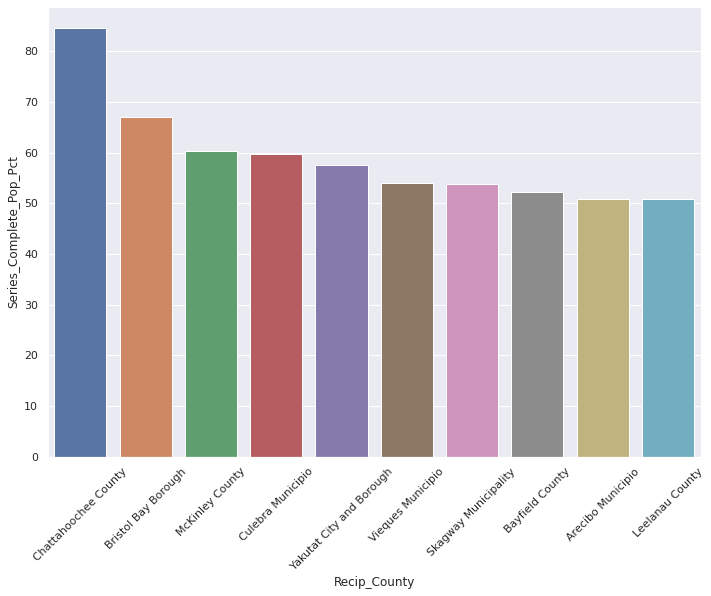

In [ ]:
sns.set(rc={'figure.figsize':(11.7,8.27)})
ax = sns.barplot(x= top10.index, y="Series_Complete_Pop_Pct", data=top10)
ax.set_xticklabels(ax.get_xticklabels(),rotation = 45)

In [ ]:
# get least 10 counties percentage
r_temp = tempDF.sort_values(by=['Series_Complete_Pop_Pct'], ascending=True)
top10 = r_temp[:10]

[Text(0, 0, 'Box Butte County'),
 Text(0, 0, 'Codington County'),
 Text(0, 0, 'Lumpkin County'),
 Text(0, 0, 'Red Willow County'),
 Text(0, 0, 'Sierra County'),
 Text(0, 0, 'Gordon County'),
 Text(0, 0, 'Brookings County'),
 Text(0, 0, 'Beadle County'),
 Text(0, 0, 'Jerauld County'),
 Text(0, 0, 'Nantucket County')]

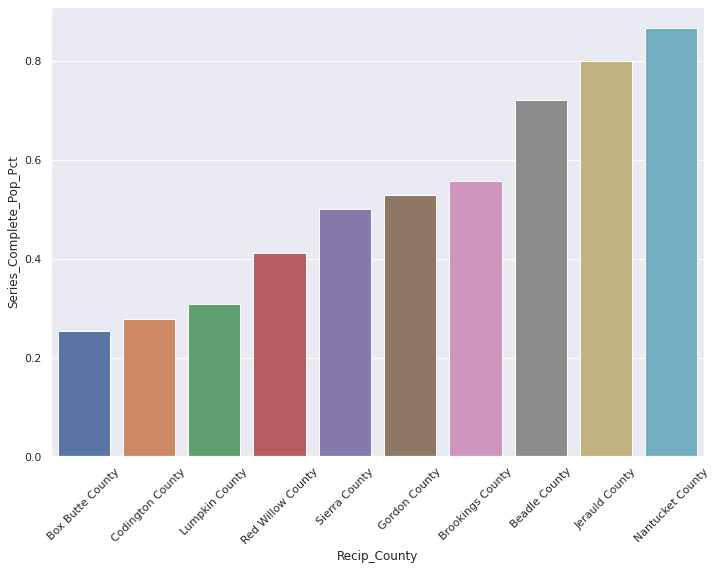

In [ ]:
sns.set(rc={'figure.figsize':(11.7,8.27)})
ax = sns.barplot(x= top10.index, y="Series_Complete_Pop_Pct", data=top10)
ax.set_xticklabels(ax.get_xticklabels(),rotation = 45)

# Geo plot

https://www.python-graph-gallery.com/choropleth-map-geopandas-python

https://geopandas.org/gallery/plotting_with_geoplot.html

https://residentmario.github.io/geoplot/index.html

https://plotly.com/python/county-choropleth/

https://geopandas.org/docs/user_guide/mapping.html

In [ ]:
geoData = gpd.read_file('https://raw.githubusercontent.com/plotly/datasets/master/geojson-counties-fips.json')

In [ ]:
geoData

,id,GEO_ID,STATE,COUNTY,NAME,LSAD,CENSUSAREA,geometry
0,01001,0500000US01001,01,001,Autauga,County,594.436,"POLYGON ((-86.49677 32.34444, -86.71790 32.402..."
1,01009,0500000US01009,01,009,Blount,County,644.776,"POLYGON ((-86.57780 33.76532, -86.75914 33.840..."
2,01017,0500000US01017,01,017,Chambers,County,596.531,"POLYGON ((-85.18413 32.87053, -85.12342 32.772..."
3,01021,0500000US01021,01,021,Chilton,County,692.854,"POLYGON ((-86.51734 33.02057, -86.51596 32.929..."
4,01033,0500000US01033,01,033,Colbert,County,592.619,"POLYGON ((-88.13999 34.58170, -88.13925 34.587..."
...,...,...,...,...,...,...,...,...
3216,51001,0500000US51001,51,001,Accomack,County,449.496,"MULTIPOLYGON (((-75.24227 38.02721, -75.29687 ..."
3217,51021,0500000US51021,51,021,Bland,County,357.725,"POLYGON ((-81.22510 37.23487, -81.20477 37.243..."
3218,51027,0500000US51027,51,027,Buchanan,County,502.763,"POLYGON ((-81.96830 37.53780, -81.92787 37.512..."
3219,51037,0500000US51037,51,037,Charlotte,County,475.271,"POLYGON ((-78.44332 37.07940, -78.49303 36.891..."


In [ ]:
geoData['NAME'] = geoData['NAME'].apply(lambda x: x + ' County')

In [ ]:
geoData

,id,GEO_ID,STATE,COUNTY,NAME,LSAD,CENSUSAREA,geometry
0,01001,0500000US01001,01,001,Autauga County,County,594.436,"POLYGON ((-86.49677 32.34444, -86.71790 32.402..."
1,01009,0500000US01009,01,009,Blount County,County,644.776,"POLYGON ((-86.57780 33.76532, -86.75914 33.840..."
2,01017,0500000US01017,01,017,Chambers County,County,596.531,"POLYGON ((-85.18413 32.87053, -85.12342 32.772..."
3,01021,0500000US01021,01,021,Chilton County,County,692.854,"POLYGON ((-86.51734 33.02057, -86.51596 32.929..."
4,01033,0500000US01033,01,033,Colbert County,County,592.619,"POLYGON ((-88.13999 34.58170, -88.13925 34.587..."
...,...,...,...,...,...,...,...,...
3216,51001,0500000US51001,51,001,Accomack County,County,449.496,"MULTIPOLYGON (((-75.24227 38.02721, -75.29687 ..."
3217,51021,0500000US51021,51,021,Bland County,County,357.725,"POLYGON ((-81.22510 37.23487, -81.20477 37.243..."
3218,51027,0500000US51027,51,027,Buchanan County,County,502.763,"POLYGON ((-81.96830 37.53780, -81.92787 37.512..."
3219,51037,0500000US51037,51,037,Charlotte County,County,475.271,"POLYGON ((-78.44332 37.07940, -78.49303 36.891..."


In [ ]:
covid_vaccine_df[covid_vaccine_df['Recip_County'] == 'Chilton County']

,Date,FIPS,MMWR_week,Recip_County,Recip_State,Series_Complete_Pop_Pct,Series_Complete_Yes,Series_Complete_12Plus,Series_Complete_12PlusPop_Pct,Series_Complete_18Plus,Series_Complete_18PlusPop_Pct,Series_Complete_65Plus,Series_Complete_65PlusPop_Pct,Completeness_pct,Administered_Dose1_Recip,Administered_Dose1_Pop_Pct,Administered_Dose1_Recip_12Plus,Administered_Dose1_Recip_12PlusPop_Pct,Administered_Dose1_Recip_18Plus,Administered_Dose1_Recip_18PlusPop_Pct,Administered_Dose1_Recip_65Plus,Administered_Dose1_Recip_65PlusPop_Pct,SVI_CTGY,Series_Complete_Pop_Pct_SVI,Series_Complete_12PlusPop_Pct_SVI,Series_Complete_18PlusPop_Pct_SVI,Series_Complete_65PlusPop_Pct_SVI,Metro_status,Series_Complete_Pop_Pct_UR_Equity,Series_Complete_12PlusPop_Pct_UR_Equity,Series_Complete_18PlusPop_Pct_UR_Equity,Series_Complete_65PlusPop_Pct_UR_Equity
1426,2021-10-20,01021,42,Chilton County,AL,31.0,13765,13764.0,36.7,13066,38.6,4611,60.7,92.5,17024.0,38.3,17021.0,45.4,16144.0,47.7,5397.0,71.0,D,14.0,14.0,14.0,15.0,Metro,2.0,2.0,2.0,3.0
5622,2021-10-19,01021,42,Chilton County,AL,30.9,13745,13744.0,36.7,13046,38.6,4608,60.6,92.5,17012.0,38.3,17009.0,45.4,16133.0,47.7,5394.0,71.0,D,14.0,14.0,14.0,15.0,Metro,2.0,2.0,2.0,3.0
9060,2021-10-18,01021,42,Chilton County,AL,30.9,13738,13737.0,36.7,13040,38.5,4608,60.6,92.5,17008.0,38.3,17005.0,45.4,16130.0,47.7,5394.0,71.0,D,14.0,14.0,14.0,15.0,Metro,2.0,2.0,2.0,3.0
11393,2021-10-17,01021,42,Chilton County,AL,30.9,13721,13720.0,36.6,13026,38.5,4608,60.6,92.5,16995.0,38.3,16992.0,45.3,16119.0,47.6,5391.0,70.9,D,14.0,14.0,14.0,15.0,Metro,2.0,2.0,2.0,3.0
14650,2021-10-16,01021,41,Chilton County,AL,30.8,13686,13685.0,36.5,12993,38.4,4603,60.6,92.5,16977.0,38.2,16974.0,45.3,16101.0,47.6,5391.0,70.9,D,14.0,14.0,14.0,15.0,Metro,2.0,2.0,2.0,3.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
859010,2021-02-01,01021,5,Chilton County,AL,0.4,172,172.0,0.5,172,0.5,15,0.2,92.9,1464.0,3.3,1464.0,3.9,1464.0,4.3,880.0,11.6,D,13.0,13.0,13.0,13.0,Metro,1.0,1.0,1.0,1.0
862639,2021-01-31,01021,5,Chilton County,AL,0.4,172,172.0,0.5,172,0.5,15,0.2,92.9,1458.0,3.3,1458.0,3.9,1458.0,4.3,877.0,11.5,D,13.0,13.0,13.0,13.0,Metro,1.0,1.0,1.0,1.0
866291,2021-01-30,01021,4,Chilton County,AL,0.4,172,172.0,0.5,172,0.5,15,0.2,93.1,1439.0,3.2,1439.0,3.8,1439.0,4.3,861.0,11.3,D,13.0,13.0,13.0,13.0,Metro,1.0,1.0,1.0,1.0
869206,2021-01-29,01021,4,Chilton County,AL,0.4,165,165.0,0.4,165,0.5,15,0.2,93.0,1379.0,3.1,1379.0,3.7,1379.0,4.1,824.0,10.8,D,13.0,13.0,13.0,13.0,Metro,1.0,1.0,1.0,1.0


In [ ]:
# Make sure the "id" column is an integer
geoData.id = geoData.id.astype(str).astype(int)

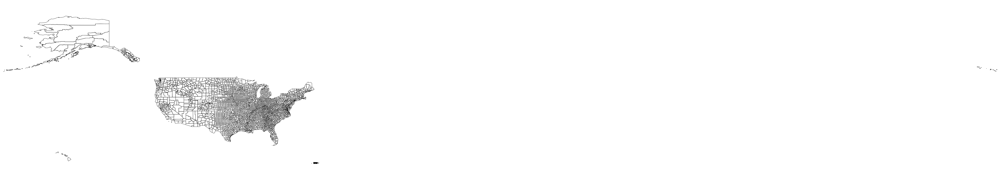

In [ ]:
# Remove Alaska, Hawaii and Puerto Rico.
# stateToRemove = ['02', '15', '72']
# geoData = geoData[~geoData.STATE.isin(stateToRemove)]

# Basic plot with just county outlines
gplt.polyplot(geoData, figsize=(100, 100));

In [ ]:
geoData.head()

,id,GEO_ID,STATE,COUNTY,NAME,LSAD,CENSUSAREA,geometry
0,1001,0500000US01001,01,001,Autauga County,County,594.436,"POLYGON ((-86.49677 32.34444, -86.71790 32.402..."
1,1009,0500000US01009,01,009,Blount County,County,644.776,"POLYGON ((-86.57780 33.76532, -86.75914 33.840..."
2,1017,0500000US01017,01,017,Chambers County,County,596.531,"POLYGON ((-85.18413 32.87053, -85.12342 32.772..."
3,1021,0500000US01021,01,021,Chilton County,County,692.854,"POLYGON ((-86.51734 33.02057, -86.51596 32.929..."
4,1033,0500000US01033,01,033,Colbert County,County,592.619,"POLYGON ((-88.13999 34.58170, -88.13925 34.587..."


# plot percentage of double doses on geoplot

In [ ]:
# merge geo spatial data and percentage data
fullData = geoData.merge(tempDF, left_on=['NAME'], right_on=['Recip_County'])

In [ ]:
fullData

,id,GEO_ID,STATE,COUNTY,NAME,LSAD,CENSUSAREA,geometry,Series_Complete_Pop_Pct
0,1001,0500000US01001,01,001,Autauga County,County,594.436,"POLYGON ((-86.49677 32.34444, -86.71790 32.402...",18.024373
1,1009,0500000US01009,01,009,Blount County,County,644.776,"POLYGON ((-86.57780 33.76532, -86.75914 33.840...",21.119675
2,47009,0500000US47009,47,009,Blount County,County,558.706,"POLYGON ((-83.79427 35.88712, -83.78419 35.879...",21.119675
3,1017,0500000US01017,01,017,Chambers County,County,596.531,"POLYGON ((-85.18413 32.87053, -85.12342 32.772...",15.659854
4,48071,0500000US48071,48,071,Chambers County,County,597.137,"POLYGON ((-94.37087 29.55507, -94.37183 29.597...",15.659854
...,...,...,...,...,...,...,...,...,...
2844,56021,0500000US56021,56,021,Laramie County,County,2685.912,"POLYGON ((-104.65334 41.65301, -104.65299 41.5...",28.624912
2845,54031,0500000US54031,54,031,Hardy County,County,582.312,"POLYGON ((-78.57190 39.03200, -78.56584 39.026...",15.719788
2846,50027,0500000US50027,50,027,Windsor County,County,969.337,"POLYGON ((-72.77154 43.47786, -72.79107 43.495...",27.161972
2847,51001,0500000US51001,51,001,Accomack County,County,449.496,"MULTIPOLYGON (((-75.24227 38.02721, -75.29687 ...",37.053676


In [ ]:
nanPercent = fullData.isna().sum() / fullData.shape[0] * 100
nanPercent

id                         0.0
GEO_ID                     0.0
STATE                      0.0
COUNTY                     0.0
NAME                       0.0
LSAD                       0.0
CENSUSAREA                 0.0
geometry                   0.0
Series_Complete_Pop_Pct    0.0
dtype: float64

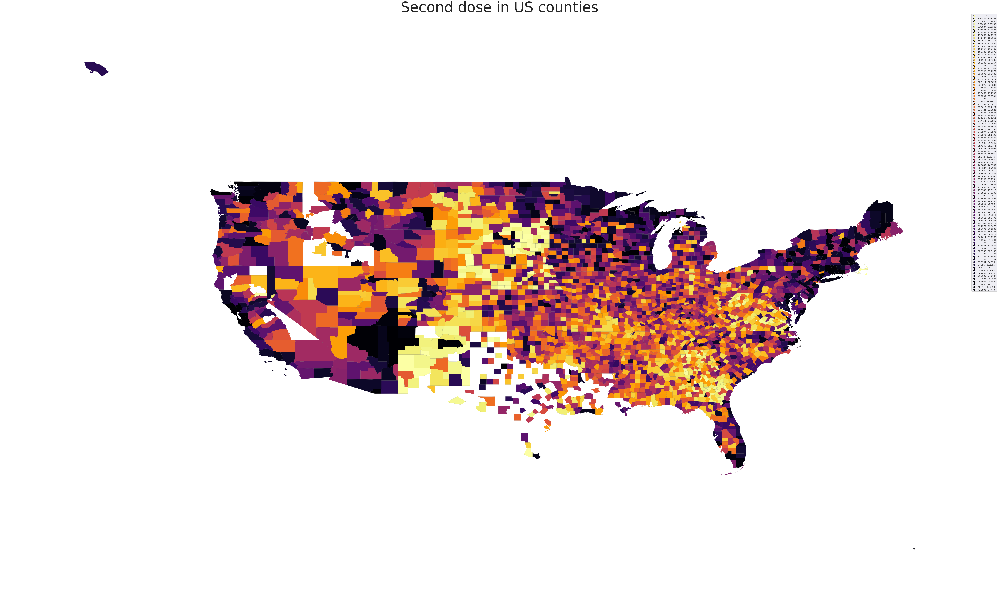

In [ ]:
fig, ax = plt.subplots(1, 1, figsize=(100, 100))
scheme = mc.Quantiles(fullData['Series_Complete_Pop_Pct'], k=100)
# Map
gplt.choropleth(fullData, 
    hue="Series_Complete_Pop_Pct", 
    linewidth=.1,
    scheme=scheme, cmap='inferno_r',
    legend=True,
    edgecolor='black',
    ax=ax
);

ax.set_title('Second dose in US counties', fontsize=80);

# https://geopandas.org/docs/user_guide/mapping.html => rather than choropleth use this link has very good representations.

In [ ]:
scheme

Quantiles             

   Interval      Count
----------------------
[ 0.25,  1.68] |    29
( 1.68,  3.99] |    28
( 3.99,  5.63] |    29
( 5.63,  6.79] |    28
( 6.79,  8.99] |    29
( 8.99, 11.16] |    28
(11.16, 12.99] |    30
(12.99, 14.17] |    28
(14.17, 15.80] |    28
(15.80, 16.64] |    28
(16.64, 17.59] |    29
(17.59, 18.17] |    28
(18.17, 18.82] |    29
(18.82, 19.36] |    30
(19.36, 19.75] |    27
(19.75, 20.19] |    28
(20.19, 20.63] |    29
(20.63, 21.04] |    28
(21.04, 21.22] |    29
(21.22, 21.51] |    30
(21.51, 21.80] |    27
(21.80, 21.96] |    31
(21.96, 22.10] |    31
(22.10, 22.34] |    25
(22.34, 22.50] |    27
(22.50, 22.67] |    30
(22.67, 22.88] |    31
(22.88, 23.07] |    25
(23.07, 23.22] |    27
(23.22, 23.27] |    39
(23.27, 23.34] |    19
(23.34, 23.54] |    42
(23.54, 23.68] |    14
(23.68, 23.74] |    41
(23.74, 23.88] |    16
(23.88, 24.15] |    37
(24.15, 24.25] |    21
(24.25, 24.45] |    36
(24.45, 24.59] |    25
(24.59, 24.59] |    25
(24.59, 24

# Web Scraping

In [ ]:
states = pd.read_csv('States.csv')

In [ ]:
states

,State
0,Alabama
1,Alaska
2,Arizona
3,Arkansas
4,California
5,Colorado
6,Connecticut
7,Delaware
8,District of Columbia
9,Florida


In [ ]:
for i in states['State']:
  

In [ ]:
dfs = pd.read_csv('Population.csv')

FileNotFoundError: ignored

In [ ]:
dfs

,FIPS*,County name,RUC code,Pop. 1990,Pop. 2000,Pop. 2010,Pop. 2020,Change 2010-20,Unnamed: 8
0,15000,Hawaii,NaN,"1,108,229","1,211,497","1,360,301","1,455,271",7.0%,NaN
1,15001,Hawaii,5.0,"120,317","148,641","185,079","200,629",8.4%,NaN
2,15003,Honolulu,2.0,"836,231","876,159","953,207","1,016,508",6.6%,NaN
3,15005,Kalawao,3.0,130,147,90,82,-8.9%,NaN
4,15007,Kauai,5.0,"51,177","58,460","67,091","73,298",9.3%,NaN
5,15009,Maui,3.0,"100,374","128,090","154,834","164,754",6.4%,NaN


In [ ]:
dfs

,FIPS*,County name,Pop. 2020
0,15000,Hawaii,"1,455,271"
1,15001,Hawaii,"200,629"
2,15003,Honolulu,"1,016,508"
3,15005,Kalawao,82
4,15007,Kauai,"73,298"
5,15009,Maui,"164,754"


In [ ]:
import os

In [ ]:
import os
df = pd.DataFrame()
directory = os.path.join("Population")
for root,dirs,files in os.walk(directory):
    for file in files:
       if file.endswith(".csv"):
           temp_dfs = pd.read_csv(directory+ '/' + file)
           df = pd.concat([temp_dfs, df])
          #  print(temp_dfs.shape)
          #  print(df.shape)

In [ ]:
df

,fips,name,current_year,State,ruc_code,estBase040190,April2000,ESTIMATESBASE2010,percentChange
0,17000,Illinois,"1,28,12,508",NaN,NaN,NaN,NaN,NaN,NaN
1,17001,Adams,"65,737",NaN,NaN,NaN,NaN,NaN,NaN
2,17003,Alexander,"5,240",NaN,NaN,NaN,NaN,NaN,NaN
3,17005,Bond,"16,725",NaN,NaN,NaN,NaN,NaN,NaN
4,17007,Boone,"53,448",NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...
17,34033,Salem,"64,837",NaN,NaN,NaN,NaN,NaN,NaN
18,34035,Somerset,"3,45,361",NaN,NaN,NaN,NaN,NaN,NaN
19,34037,Sussex,"1,44,221",NaN,NaN,NaN,NaN,NaN,NaN
20,34039,Union,"5,75,345",NaN,NaN,NaN,NaN,NaN,NaN


In [ ]:
df.drop(['State', 'ruc_code', 'estBase040190', 'April2000', 'ESTIMATESBASE2010', 'percentChange'], axis=1, inplace=True)

In [ ]:
df

,fips,name,current_year
0,17000,Illinois,"1,28,12,508"
1,17001,Adams,"65,737"
2,17003,Alexander,"5,240"
3,17005,Bond,"16,725"
4,17007,Boone,"53,448"
...,...,...,...
17,34033,Salem,"64,837"
18,34035,Somerset,"3,45,361"
19,34037,Sussex,"1,44,221"
20,34039,Union,"5,75,345"


In [ ]:
df.rename(columns={"current_year": "population_count"}, errors="raise")

,fips,name,population_count
0,17000,Illinois,"1,28,12,508"
1,17001,Adams,"65,737"
2,17003,Alexander,"5,240"
3,17005,Bond,"16,725"
4,17007,Boone,"53,448"
...,...,...,...
17,34033,Salem,"64,837"
18,34035,Somerset,"3,45,361"
19,34037,Sussex,"1,44,221"
20,34039,Union,"5,75,345"


In [ ]:
df.to_csv('county_population', encoding='utf-8', index=False)

# Population Dataset

In [ ]:
%ls

 county_population.csv                                  'education data'/
 COVID-19_Vaccinations_in_the_United_States_County.csv   populationData/


In [ ]:
population_df = pd.read_csv('county_population.csv', low_memory = False)

In [ ]:
population_df

,fips,Name,Population
0,17000,Illinois,"1,28,12,508"
1,17001,Adams,"65,737"
2,17003,Alexander,"5,240"
3,17005,Bond,"16,725"
4,17007,Boone,"53,448"
...,...,...,...
3377,34033,Salem,"64,837"
3378,34035,Somerset,"3,45,361"
3379,34037,Sussex,"1,44,221"
3380,34039,Union,"5,75,345"


In [ ]:
population_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3382 entries, 0 to 3381
Data columns (total 3 columns):
 #   Column      Non-Null Count  Dtype 
---  ------      --------------  ----- 
 0   fips        3328 non-null   object
 1   Name        3328 non-null   object
 2   Population  3214 non-null   object
dtypes: object(3)
memory usage: 79.4+ KB


In [ ]:
population_df["fips"] = pd.to_numeric(population_df["fips"], errors='coerce')

In [ ]:
covid_vaccine_df["FIPS"] = pd.to_numeric(covid_vaccine_df["FIPS"], errors='coerce')

In [ ]:
type(covid_vaccine_df['FIPS'][0]), type(population_df['fips'][0])

(numpy.float64, numpy.float64)

In [ ]:
# merge geo spatial data and percentage data
fullData = population_df.merge(covid_vaccine_df, left_on=['fips'], right_on=['FIPS'])

In [ ]:
population_df.shape, covid_vaccine_df.shape ,fullData.shape

((3382, 3), (1023988, 32), (3884443, 35))

,fips,Name,Population,Date,FIPS,MMWR_week,Recip_County,Recip_State,Series_Complete_Pop_Pct,Series_Complete_Yes,Series_Complete_12Plus,Series_Complete_12PlusPop_Pct,Series_Complete_18Plus,Series_Complete_18PlusPop_Pct,Series_Complete_65Plus,Series_Complete_65PlusPop_Pct,Completeness_pct,Administered_Dose1_Recip,Administered_Dose1_Pop_Pct,Administered_Dose1_Recip_12Plus,Administered_Dose1_Recip_12PlusPop_Pct,Administered_Dose1_Recip_18Plus,Administered_Dose1_Recip_18PlusPop_Pct,Administered_Dose1_Recip_65Plus,Administered_Dose1_Recip_65PlusPop_Pct,SVI_CTGY,Series_Complete_Pop_Pct_SVI,Series_Complete_12PlusPop_Pct_SVI,Series_Complete_18PlusPop_Pct_SVI,Series_Complete_65PlusPop_Pct_SVI,Metro_status,Series_Complete_Pop_Pct_UR_Equity,Series_Complete_12PlusPop_Pct_UR_Equity,Series_Complete_18PlusPop_Pct_UR_Equity,Series_Complete_65PlusPop_Pct_UR_Equity
0,17001.0,Adams,"65,737",2021-10-20,17001.0,42,Adams County,IL,45.0,29478,29448.0,52.9,28182,55.6,10082,74.6,97.8,35667.0,54.5,35612.0,64.0,34085.0,67.3,12473.0,92.3,A,3.0,4.0,4.0,4.0,Non-metro,7.0,8.0,8.0,8.0
1,17001.0,Adams,"65,737",2021-10-19,17001.0,42,Adams County,IL,45.0,29478,29448.0,52.9,28182,55.6,10082,74.6,97.8,35666.0,54.5,35611.0,64.0,34084.0,67.3,12473.0,92.3,A,3.0,4.0,4.0,4.0,Non-metro,7.0,8.0,8.0,8.0
2,17001.0,Adams,"65,737",2021-10-18,17001.0,42,Adams County,IL,45.0,29478,29448.0,52.9,28182,55.6,10082,74.6,97.8,35666.0,54.5,35611.0,64.0,34084.0,67.3,12473.0,92.3,A,3.0,4.0,4.0,4.0,Non-metro,7.0,8.0,8.0,8.0
3,17001.0,Adams,"65,737",2021-10-17,17001.0,42,Adams County,IL,45.0,29477,29447.0,52.9,28182,55.6,10082,74.6,97.8,35666.0,54.5,35611.0,64.0,34084.0,67.3,12473.0,92.3,A,3.0,4.0,4.0,4.0,Non-metro,7.0,8.0,8.0,8.0
4,17001.0,Adams,"65,737",2021-10-16,17001.0,41,Adams County,IL,45.0,29477,29447.0,52.9,28182,55.6,10082,74.6,97.8,35664.0,54.5,35609.0,64.0,34082.0,67.3,12473.0,92.3,A,3.0,4.0,4.0,4.0,Non-metro,7.0,8.0,8.0,8.0


In [ ]:
populationFips = population_df['fips'].unique()
vaccineFip = covid_vaccine_df['FIPS'].unique()

In [ ]:
populationFips

array(['17000', '17001', '17003', ..., '34037', '34039', '34041'],
      dtype=object)

In [ ]:
# populationFips.intersection(vaccineFip)
np.intersect1d(populationFips, vaccineFip)

TypeError: ignored

In [ ]:
populationFips

array(['17000', '17001', '17003', ..., '34037', '34039', '34041'],
      dtype=object)